# Classifying Room Occupancy according to <br> Four Environmental Factors

## 1. Introduction
In today’s world, the use of home-based technology systems is becoming increasingly utilized for our convenience. Household technology such as Alexa, Google Assistant and Siri are often an integral aspect of many people’s lives. We want to explore how this technology can be maximized by analyzing how it can detect occupancy in a room.

Our dataset analyzes room occupancy based on the measurements of temperature, humidity, light, and CO2 levels in the room. Occupancy is the categorical variable with two possible outcomes: occupied or unoccupied. We found this dataset interesting due to its suitability for classification analysis with simple categorical variables and transparent environmental variables. Specifically, we wanted to analyze the question: Is the room occupied based on temperature, humidity, light, and CO2 levels?

## 2. Preliminary Exploratory Data Analysis

#### Accessing Data
First, we will load the tidyverse library. Then, we need to download our data and save it as a tibble for future data wrangling.
Our data was only available as a .zip file, so we downloaded it, unzipped the necessary data, and read it into a CSV.

In [2]:
library(tidyverse)
library(repr)
library(tidymodels)

temp <- tempfile()
download.file("https://archive.ics.uci.edu/static/public/357/occupancy+detection.zip",temp)
data <- read.csv(unz(temp, "datatraining.txt"))
unlink(temp)

occupancyData <- tibble(data)
head(occupancyData)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.3     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
── Attaching packages ────────────────────────────────────── tidymodels 1.1.1 ──

✔ broom        1.0.5     ✔ rsample      1.2.0
✔ dials        1.2.0     ✔ tune         1.1.2
✔ infer        1.0.5     ✔ workflows    1.1.3
✔ modeldata    1.2.0     ✔ workflowsets 1.0.1
✔ parsnip      1.1.1     ✔ yardstick    1.2.0
✔ recipes      1.0.8     

── Conflicts ───────────────────────────────────────── tidymodels_conflicts() ──
✖ scales::discard() masks purrr::discard()
✖ dplyr::filt

date,Temperature,Humidity,Light,CO2,HumidityRatio,Occupancy
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
2015-02-04 17:51:00,23.18,27.2720,426.0,721.25,0.004792988,1
2015-02-04 17:51:59,23.15,27.2675,429.5,714.00,0.004783441,1
2015-02-04 17:53:00,23.15,27.2450,426.0,713.50,0.004779464,1
2015-02-04 17:54:00,23.15,27.2000,426.0,708.25,0.004771509,1
2015-02-04 17:55:00,23.10,27.2000,426.0,704.50,0.004756993,1
2015-02-04 17:55:59,23.10,27.2000,419.0,701.00,0.004756993,1


#### Selecting Necessary Columns
We don't need date, and we don't need HumidityRatio (as we already have humidity) but all other columns are necessary.

In [3]:
selectedOccupancyData <- occupancyData[,-c(1, 6)]
head(selectedOccupancyData)

Temperature,Humidity,Light,CO2,Occupancy
<dbl>,<dbl>,<dbl>,<dbl>,<int>
23.18,27.2720,426.0,721.25,1
23.15,27.2675,429.5,714.00,1
23.15,27.2450,426.0,713.50,1
23.15,27.2000,426.0,708.25,1
23.10,27.2000,426.0,704.50,1
23.10,27.2000,419.0,701.00,1


#### Splitting Data For Training / Testing
Now that we have only the necessary columns, we will continue to split the data into training and testing sets.
We will use a 75/25 split.

In [4]:
occupancy_split <- initial_split(selectedOccupancyData, prop = 0.75, strata = Occupancy)  
occupancy_train <- training(occupancy_split)
occupancy_test <- testing(occupancy_split)

head(occupancy_train)
head(occupancy_test)

Temperature,Humidity,Light,CO2,Occupancy
<dbl>,<dbl>,<dbl>,<dbl>,<int>
23.000,27.200,0,681.5,0
22.945,27.290,0,685.0,0
22.890,27.390,0,689.0,0
22.890,27.390,0,689.5,0
22.890,27.390,0,689.0,0
22.890,27.445,0,691.0,0


Temperature,Humidity,Light,CO2,Occupancy
<dbl>,<dbl>,<dbl>,<dbl>,<int>
23.150,27.2675,429.5,714.0,1
23.150,27.2450,426.0,713.5,1
23.100,27.2000,419.0,701.0,1
23.075,27.1750,419.0,688.0,1
22.945,27.3900,0.0,685.0,0
22.890,27.5000,0.0,688.0,0


#### Summarizing the Data
We will summarize the data, counting the various values and checking for empty/NA

In [5]:
# Summarizing the data
summary_table <- occupancy_train |>
    # Summarize each column
    summarise(
        Total_Observations = n(),
        Missing_Temperature = sum(is.na(Temperature)),
        Mean_Temperature = mean(Temperature, na.rm = TRUE),
        Missing_Humidity = sum(is.na(Humidity)),
        Mean_Humidity = mean(Humidity, na.rm = TRUE),
        Missing_Light = sum(is.na(Light)),
        Mean_Light = mean(Light, na.rm = TRUE),
        Missing_CO2 = sum(is.na(CO2)),
        Mean_CO2 = mean(CO2, na.rm = TRUE),
        Occupancy_Count_0 = sum(Occupancy == 0, na.rm = TRUE),
        Occupancy_Count_1 = sum(Occupancy == 1, na.rm = TRUE))

# View the summary table
summary_table

Total_Observations,Missing_Temperature,Mean_Temperature,Missing_Humidity,Mean_Humidity,Missing_Light,Mean_Light,Missing_CO2,Mean_CO2,Occupancy_Count_0,Occupancy_Count_1
<int>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<int>
6106,0,20.6176,0,25.76697,0,119.2799,0,606.5148,4810,1296


#### Visualizing the Data

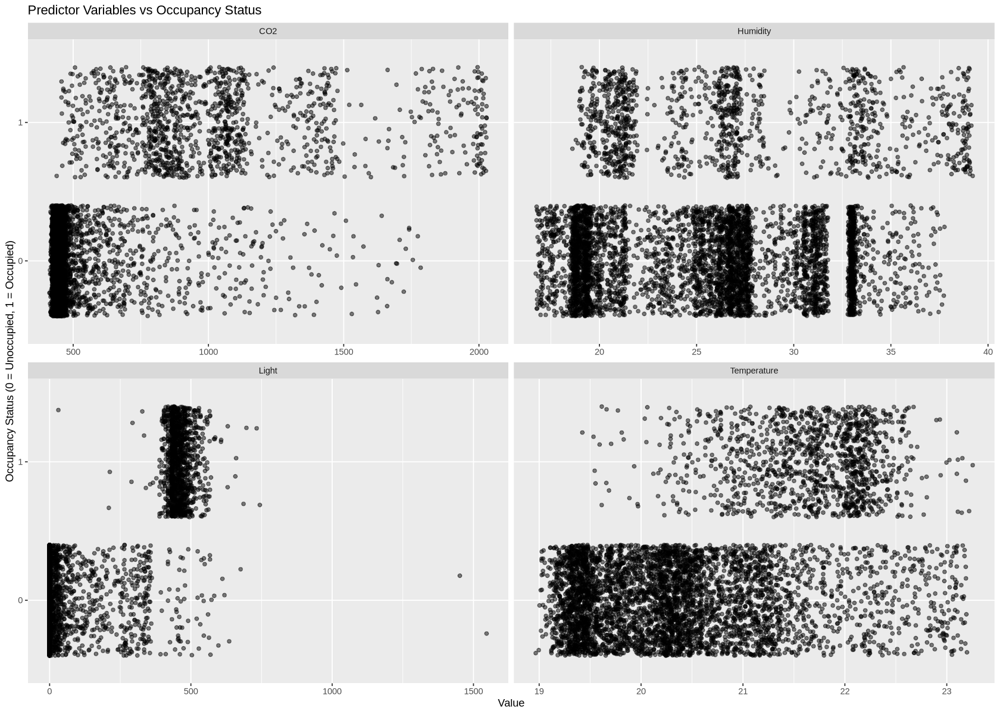

In [6]:
options(repr.plot.width=14, repr.plot.height=10)

# Reshape data to long format for faceting
occupancy_long <- occupancy_train |>
    pivot_longer(cols = -Occupancy, names_to = "variable", values_to = "value")

# Create a 2x2 grid of scatterplots with jitter
combined_plot <- ggplot(occupancy_long, aes(x = value, y = as.factor(Occupancy))) +
    geom_jitter(alpha = 0.5, width = 0.1) +
    facet_wrap(~variable, scales = "free_x", ncol = 2) +
    labs(x = "Value", y = "Occupancy Status (0 = Unoccupied, 1 = Occupied)", title = "Predictor Variables vs Occupancy Status")

# Print the combined plot
print(combined_plot)

Each of these 4 graphs is ultimately the same, except for having different values on the x-axis (denoted in title of each graph).
These graphs are useful to show the distribution of our different predictor variables and how they are distributed among the two y-axis cases of the room being occupied vs unoccupied.

Note the usage of a jitter-plot instead of a typical scatter plot, as many of the values would otherwise overlap and make it harder to understand the distribution of points.

## 3. Methods
We will begin by importing the Occupancy Detection dataset into Jupyter, focusing on Temperature, Humidity, Light, and CO2 to forecast room occupancy, while discarding “date” and “Humidity Ratio” to avoid redundancy and overemphasis on humidity in our KNN model. After preprocessing, the dataset will be divided into a 75% training set and a 25% testing set. We’ll determine the optimal K for the KNN model by performing cross-validation with 5 folds on the training data, incorporating a preprocessing recipe and the KNN model with a tunable K parameter. The K yielding the highest accuracy will be selected for retraining the KNN classifier on the full training dataset before making predictions on the test set. Finally, we will use a confusion matrix and a stacked bar graph comparing predicted to actual occupancy to assess the model’s performance.

## 4. Expected Outcomes and Significance
We expect higher humidities, temperatures, light and CO2 levels when a room is occupied. These findings could be utilized by household technology companies, allowing them to develop automatic lighting systems that incorporate more efficient sensors, thus improving the accuracy of occupancy detection for better lighting control. This study is not only limited to temperature, humidity, light, and CO2 levels; future studies could explore other measurements such as oxygen levels, noise levels, or dust particles in the room. By analyzing more variables, the occupancy detection of household systems will be optimized, significantly boosting the quality of life of millions around the world.